In [1]:
import scipy.io as sio
import matplotlib.pyplot as plt
import numpy as  np
import pandas as pd
import math
from scipy import signal
from scipy.fft import fft, fftfreq

In [2]:
sig = sio.loadmat('./01_01_edfm')
sig

{'__header__': b'MATLAB 5.0',
 '__version__': '1.0',
 '__globals__': [],
 'val': array([[ -46,    0,    0, ...,  -46,  -23,  -13],
        [ 100,    0,    0, ...,  -60,  -58,  -53],
        [ -10,    0,    0, ...,  151,  154,  151],
        ...,
        [ -24,    0,    0, ...,  124,   71,   32],
        [-102,    0,    0, ...,  111,   98,   92],
        [-154,    0,    0, ...,   49,   67,   82]], dtype=int16)}

In [3]:
attack = []
normal = []
for i in range (23):
    attack.append(sig['val'][i][2996*256:3036*256])
    normal.append(sig['val'][i][1996*256:2036*256])

# Q1

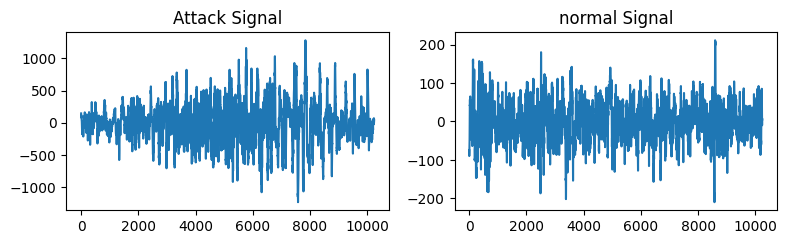

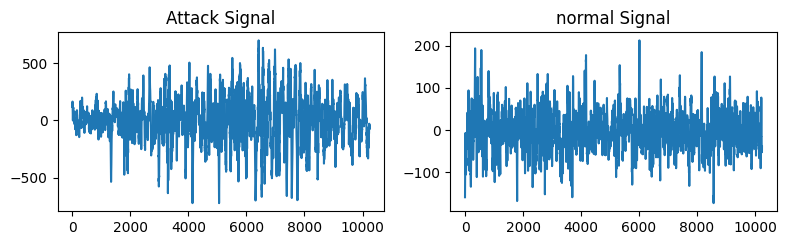

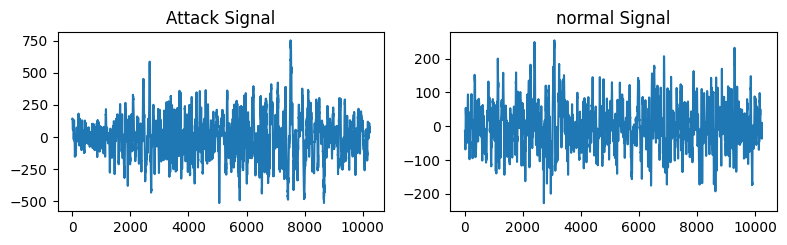

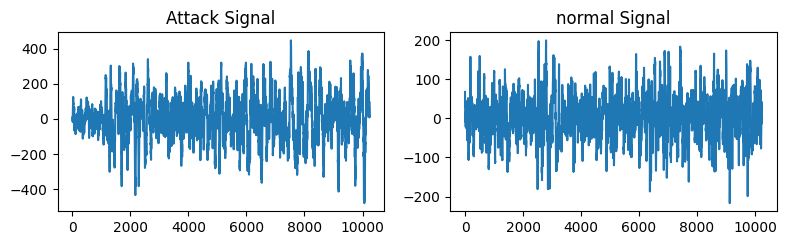

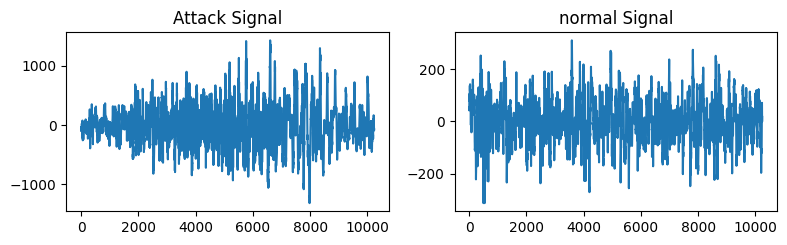

...

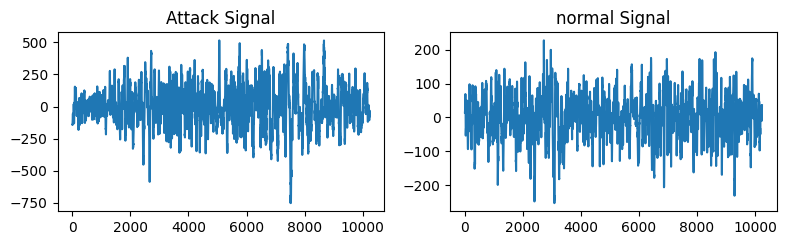

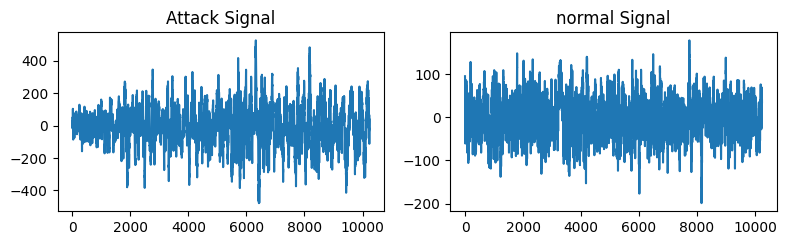

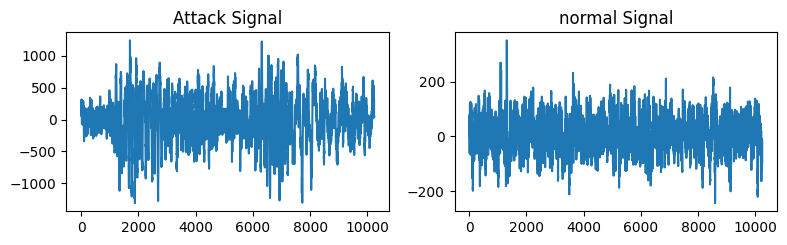

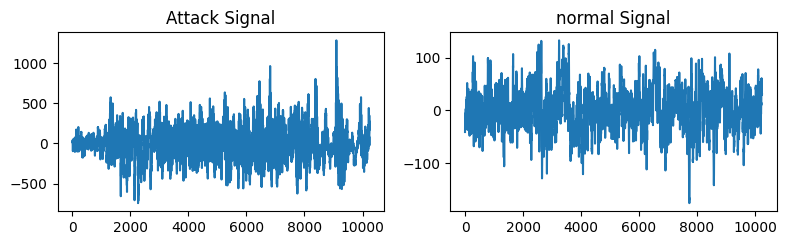

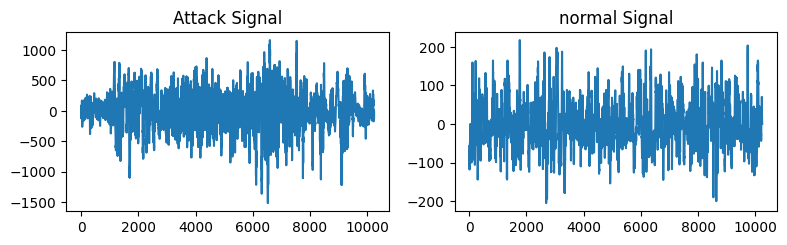

In [4]:
for i in range (23):
    plt.figure(figsize=(8,50))
    plt.subplot(23,2,2*i+1)
    plt.plot(attack[i])
    plt.title('Attack Signal')

    plt.subplot(23,2,2*i+2)
    plt.plot(normal[i])
    plt.title('normal Signal')
    plt.tight_layout()
    plt.show()

# Q2

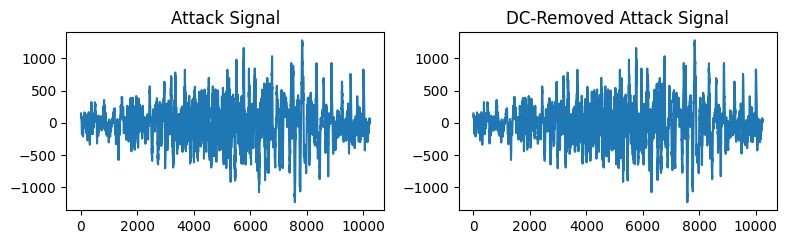

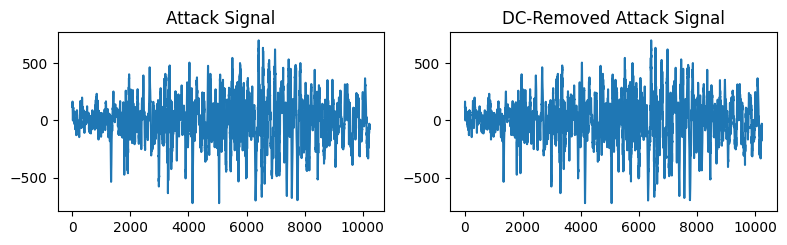

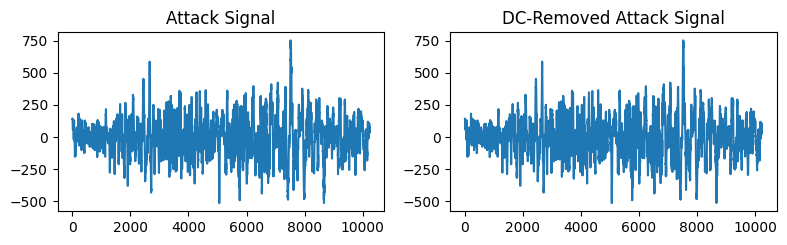

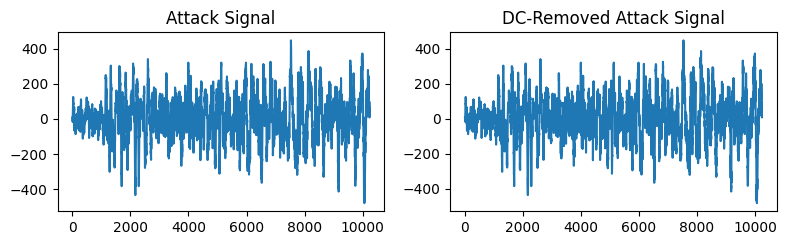

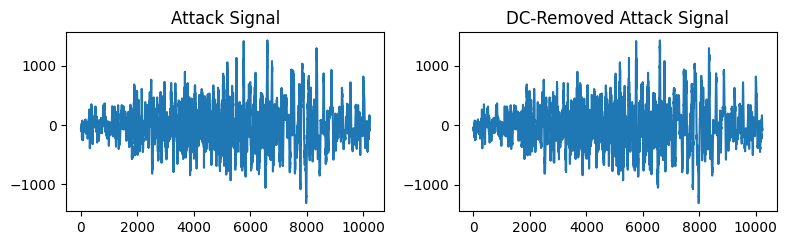

...

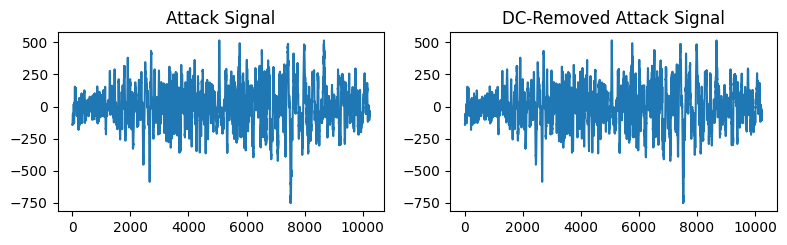

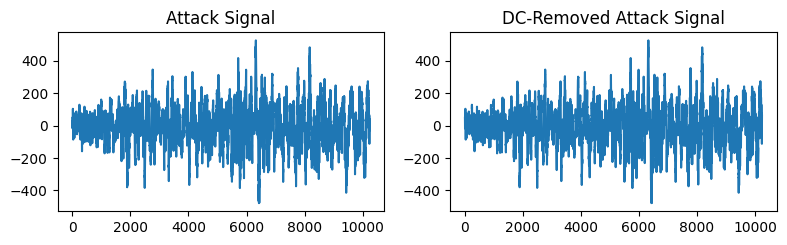

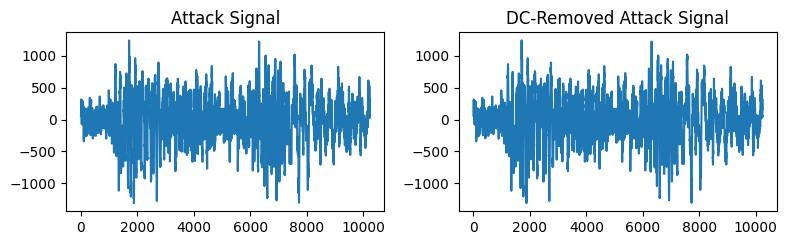

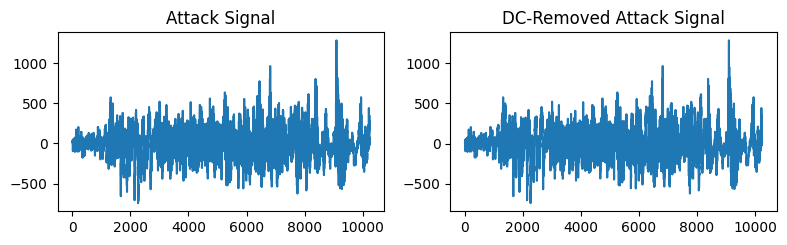

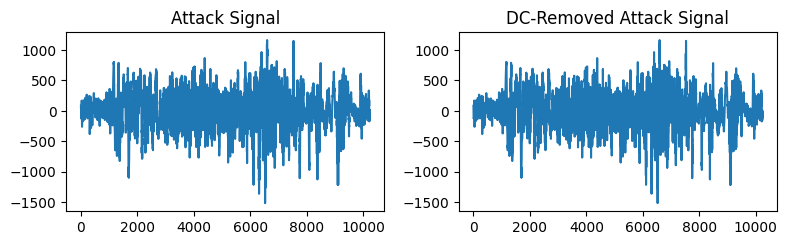

In [5]:
attack_DCRemoved = []
for i in range (23):
    attack_DCRemoved.append(attack[i] - np.mean(attack[i]))
    plt.figure(figsize=(8,50))
    plt.subplot(23,2,2*i+1)
    plt.plot(attack[i])
    plt.title('Attack Signal')

    plt.subplot(23,2,2*i+2)
    plt.plot(attack_DCRemoved[i])
    plt.title('DC-Removed Attack Signal')
    plt.tight_layout()
    plt.show()

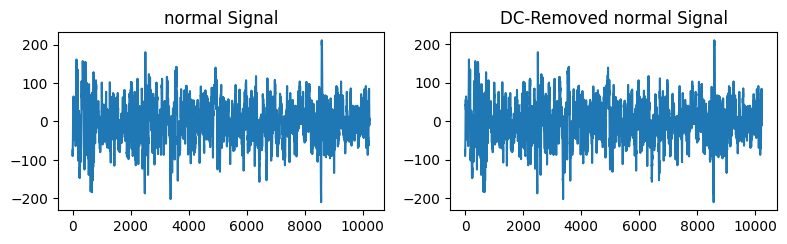

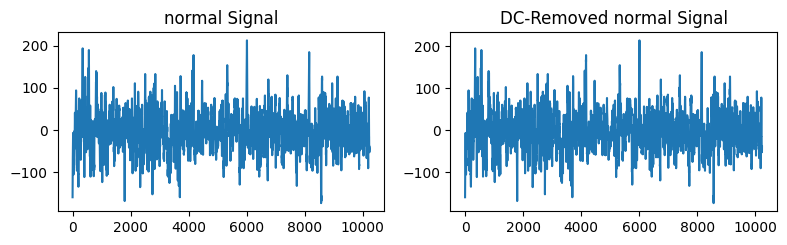

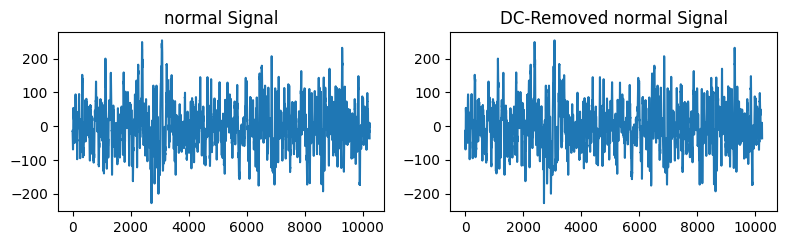

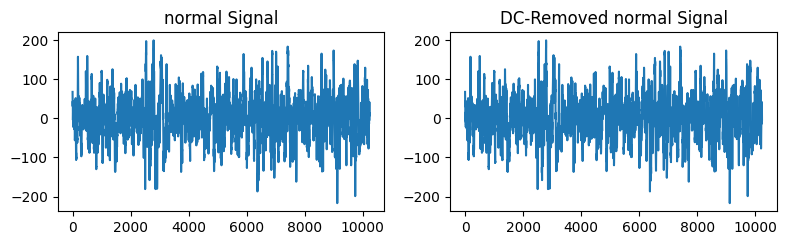

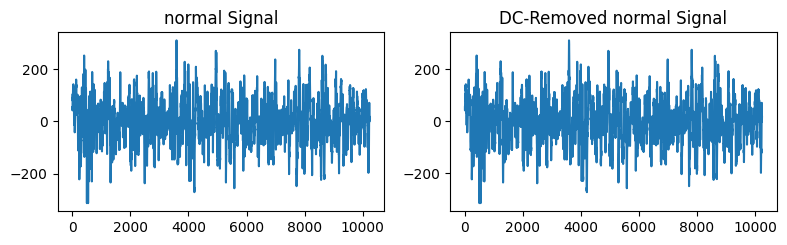

...

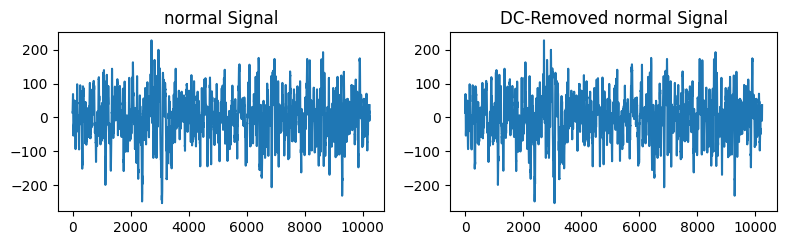

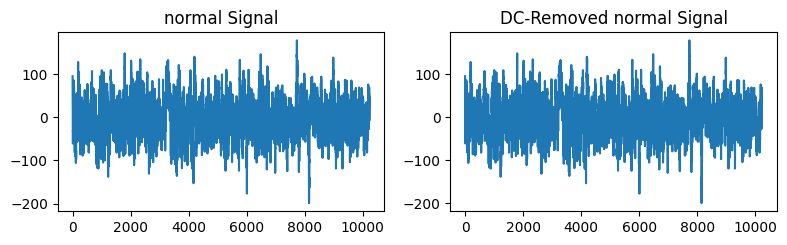

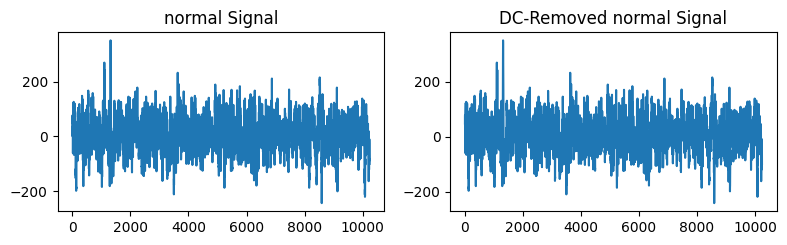

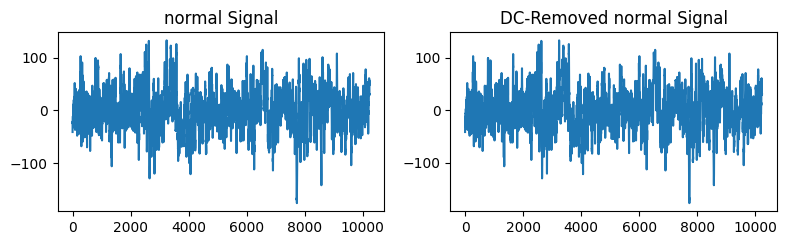

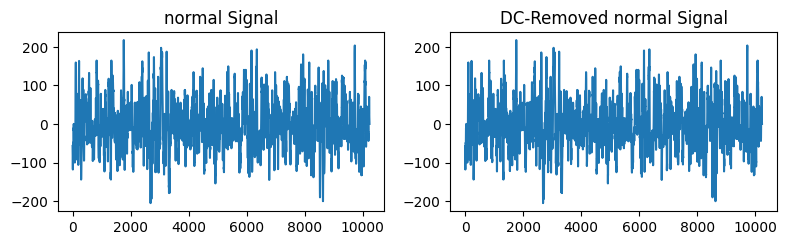

In [6]:
normal_DCRemoved = []
for i in range (23):
    normal_DCRemoved.append(normal[i] - np.mean(normal[i]))
    plt.figure(figsize=(8,50))
    plt.subplot(23,2,2*i+1)
    plt.plot(normal[i])
    plt.title('normal Signal')

    plt.subplot(23,2,2*i+2)
    plt.plot(normal_DCRemoved[i])
    plt.title('DC-Removed normal Signal')
    plt.tight_layout()
    plt.show()

# Q3

In [8]:
window_size = 13

# Initialize an empty list to store moving averages
moving_attack = [[] for j in range (23)]
moving_normal = [[] for j in range (23)]
# Loop through the array t o
#consider every window of size 3
for j in range (23) :
	while i < len(attack_DCRemoved[j]) - window_size + 1:

		# Calculate the average of current window
		window_average = round(np.sum(attack_DCRemoved[j][
		i:i+window_size]) / window_size, 2)
	
		# Store the average of current
		# window in moving average list
		moving_attack[j].append(window_average)

		# Shift window to right by one position
		#i += 1

		# Calculate the average of current window
		window_average = round(np.sum(normal_DCRemoved[j][
		i:i+window_size]) / window_size, 2)
	
		# Store the average of current
		# window in moving average list
		moving_normal[j].append(window_average)

		# Shift window to right by one position
		i += 1
	i = 0


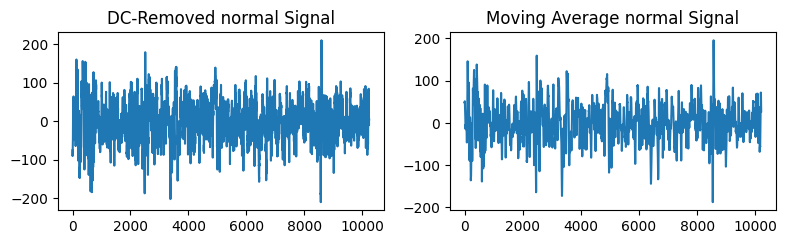

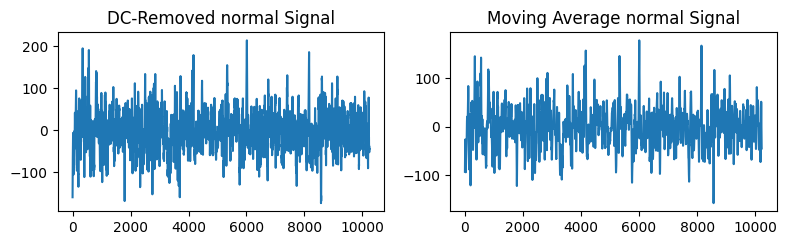

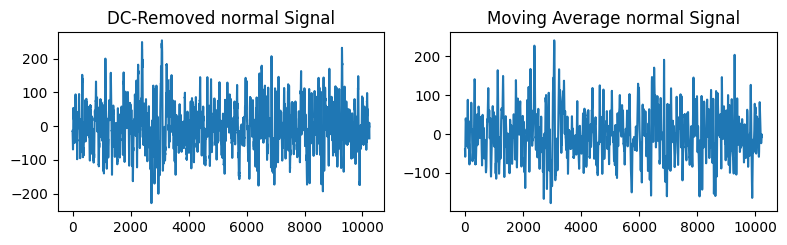

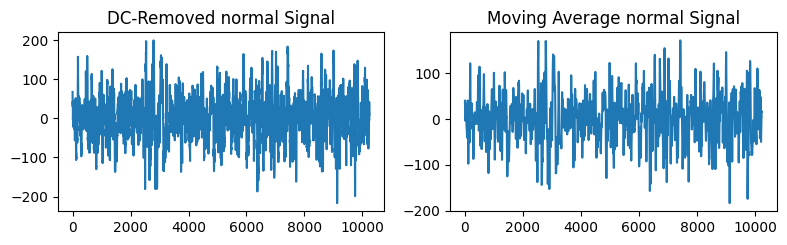

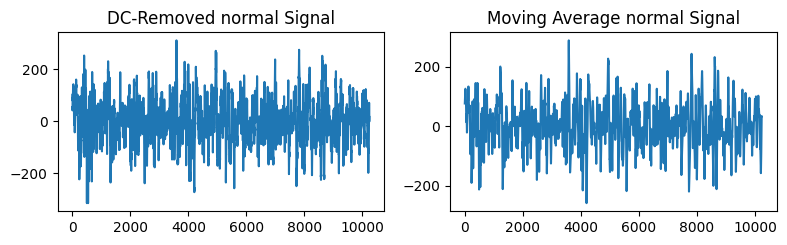

...

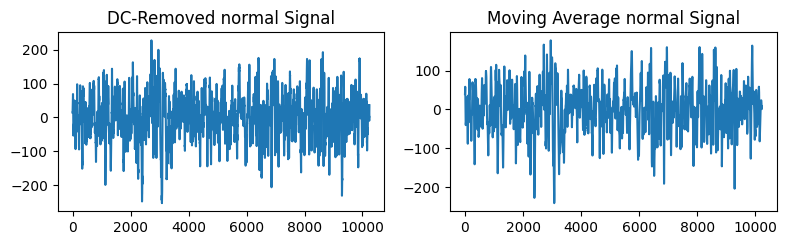

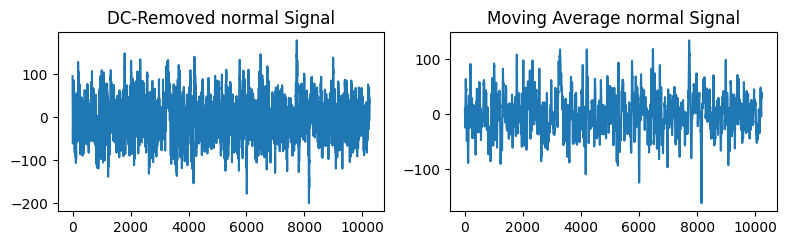

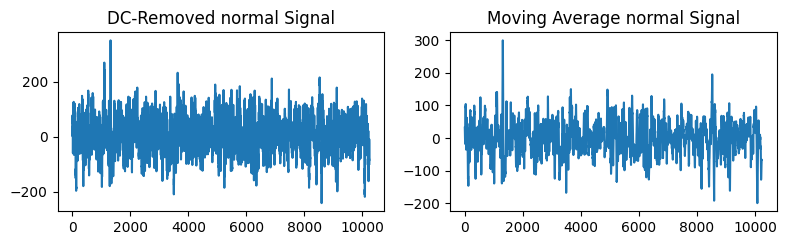

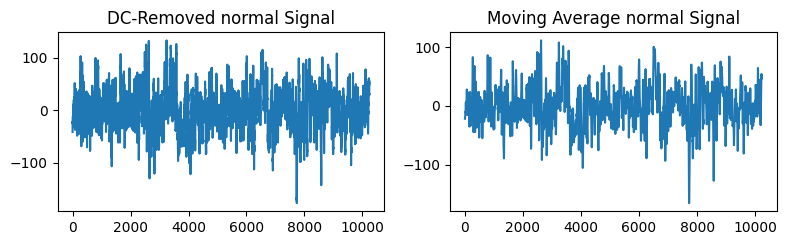

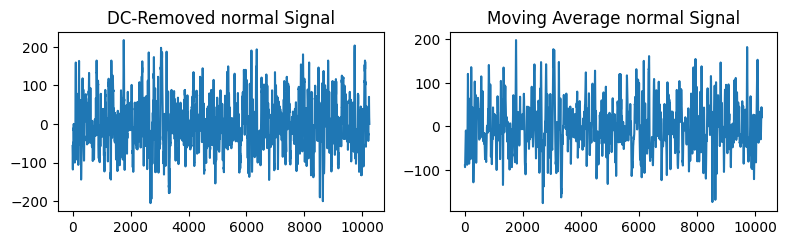

In [9]:
for i in range (23):
    plt.figure(figsize=(8,50))
    plt.subplot(23,2,2*i+1)
    plt.plot(normal_DCRemoved[i])
    plt.title('DC-Removed normal Signal')

    plt.subplot(23,2,2*i+2)
    plt.plot(moving_normal[i])
    plt.title('Moving Average normal Signal')
    plt.tight_layout()
    plt.show()

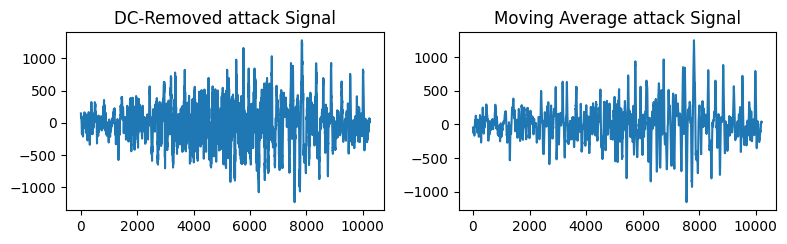

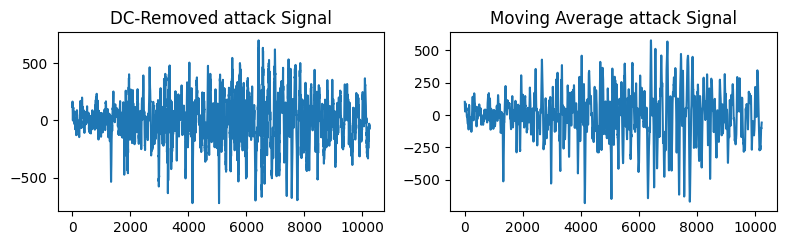

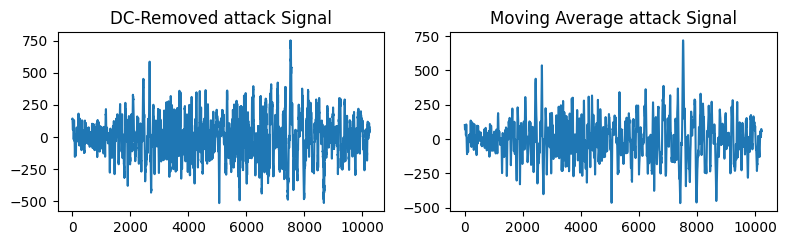

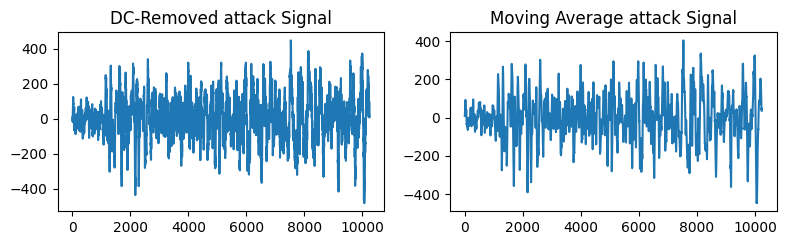

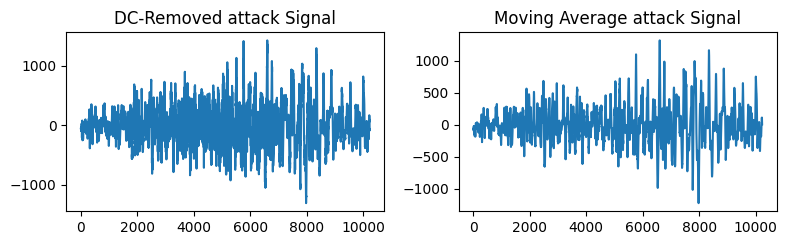

...

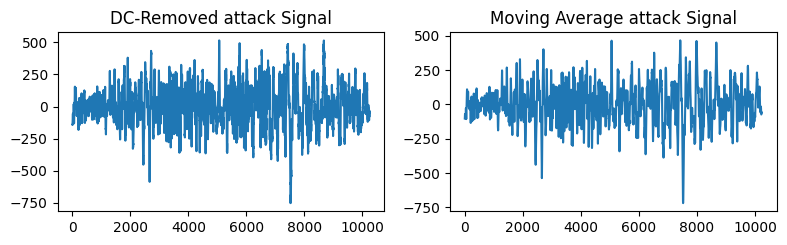

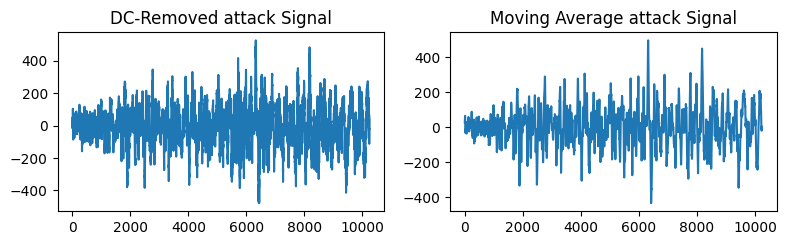

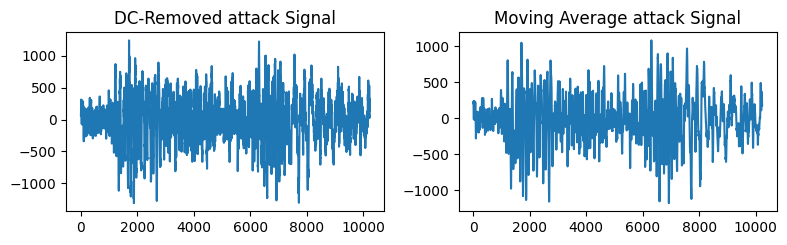

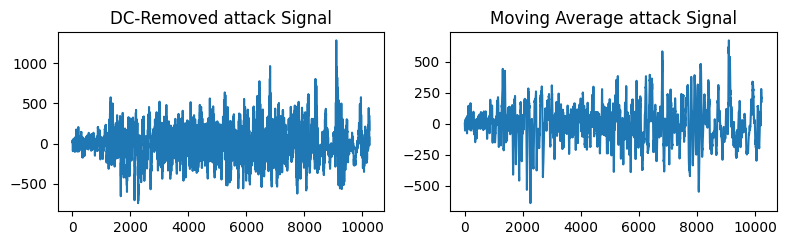

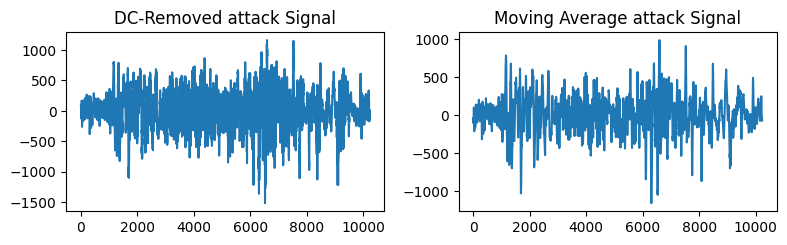

In [10]:
for i in range (23):
    plt.figure(figsize=(8,50))
    plt.subplot(23,2,2*i+1)
    plt.plot(attack_DCRemoved[i])
    plt.title('DC-Removed attack Signal')

    plt.subplot(23,2,2*i+2)
    plt.plot(moving_attack[i])
    plt.title('Moving Average attack Signal')
    plt.tight_layout()
    plt.show()

# Q5

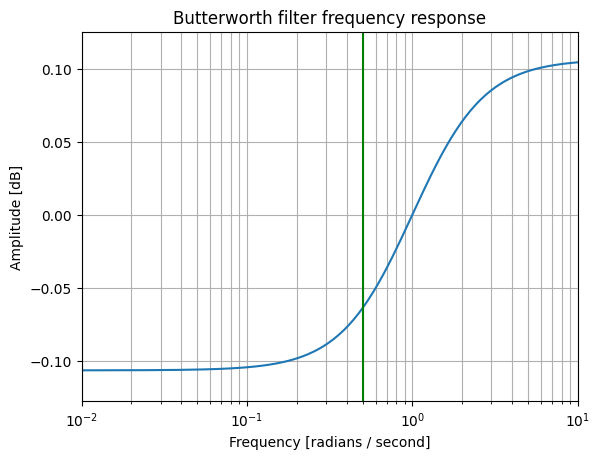

In [11]:
b, a = signal.butter(3,0.5, btype='highpass',fs=256)
w, h = signal.freqs(a, b)
plt.semilogx(w, 20 * np.log10(abs(h)))
plt.title('Butterworth filter frequency response')
plt.xlabel('Frequency [radians / second]')
plt.ylabel('Amplitude [dB]')
plt.margins(0, 0.1)
plt.grid(which='both', axis='both')
plt.axvline(0.5, color='green') # cutoff frequency
plt.show()

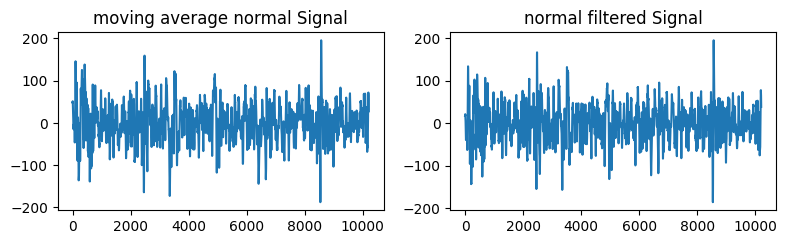

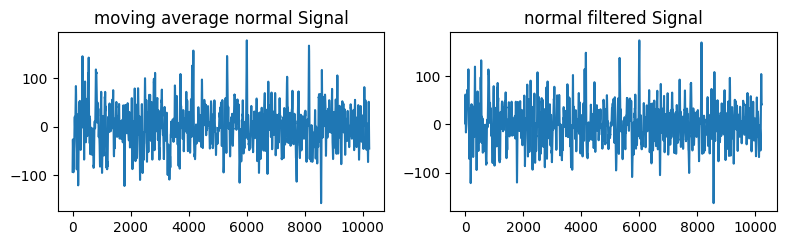

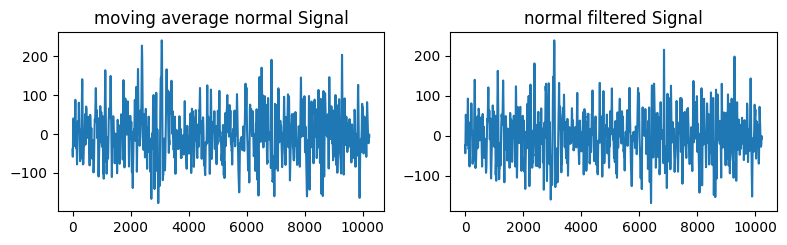

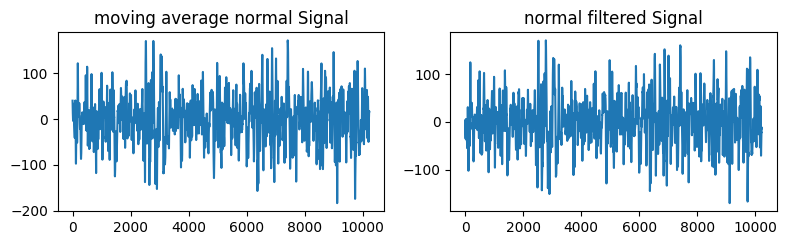

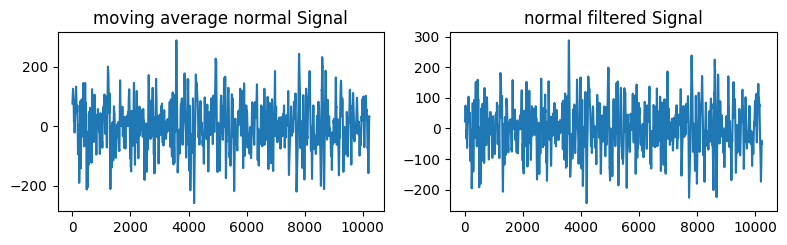

...

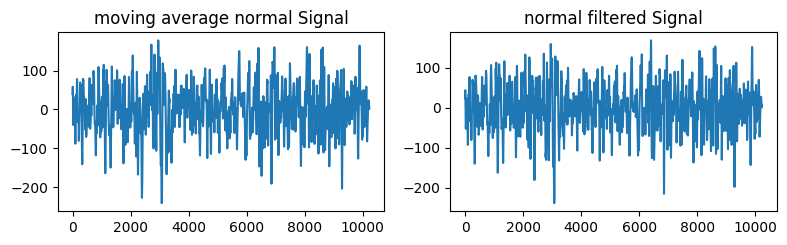

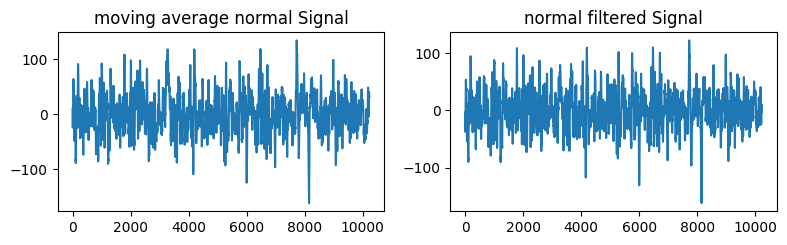

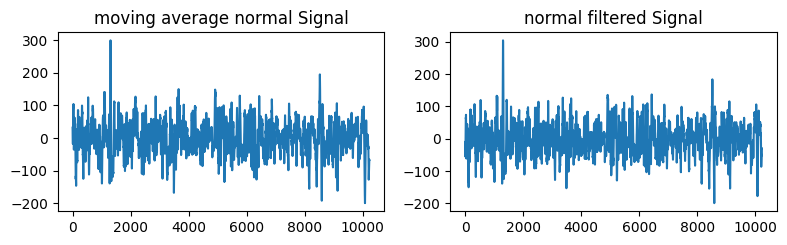

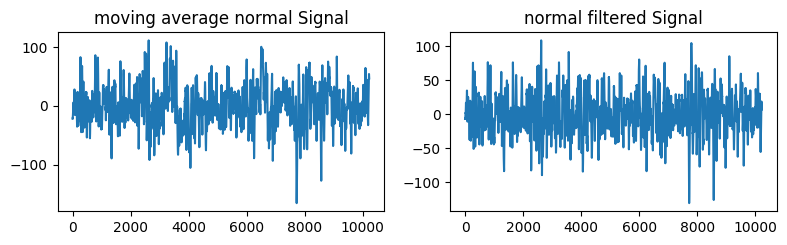

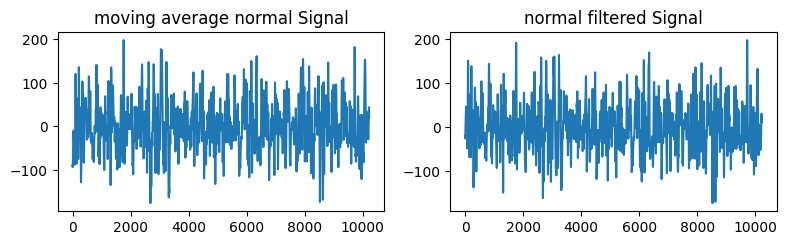

In [12]:
normal_filtered = []
for i in range (23):
    normal_filtered.append(signal.filtfilt(b,a,moving_normal[i]))
    plt.figure(figsize=(8,50))
    plt.subplot(23,2,2*i+1)
    plt.plot(moving_normal[i])
    plt.title('moving average normal Signal')

    plt.subplot(23,2,2*i+2)
    plt.plot(normal_filtered[i])
    plt.title('normal filtered Signal')
    plt.tight_layout()
    plt.show()

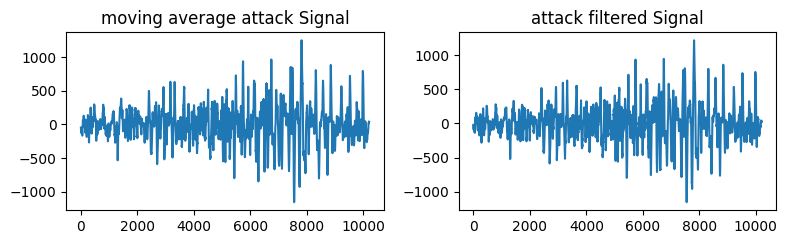

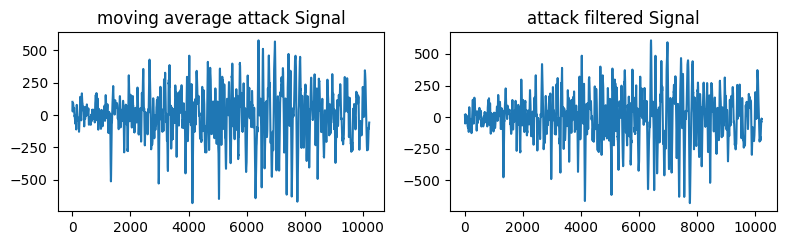

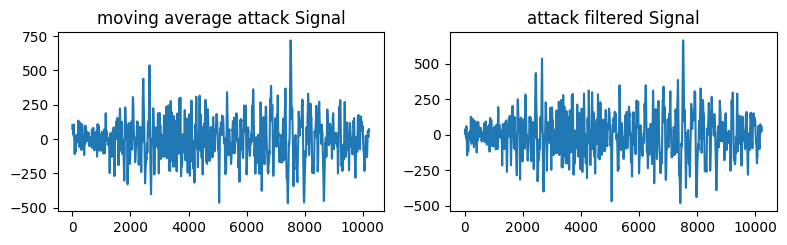

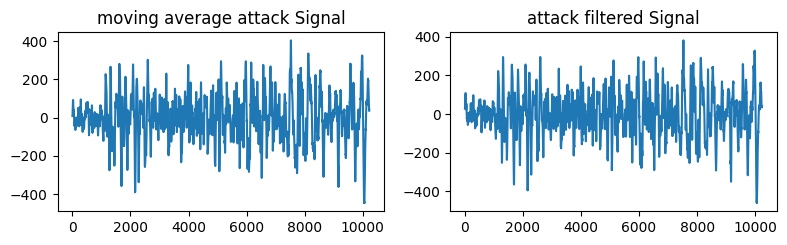

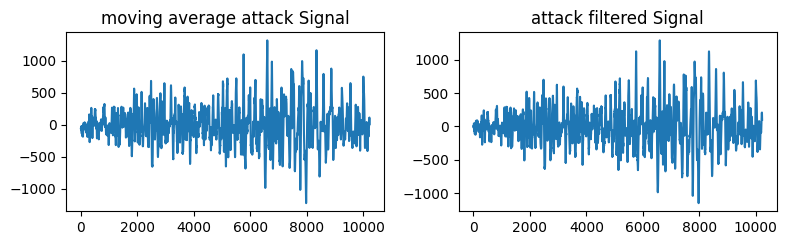

...

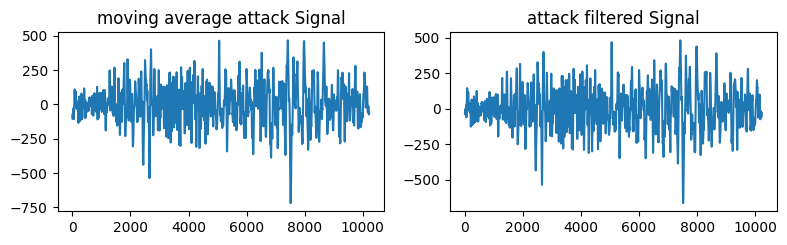

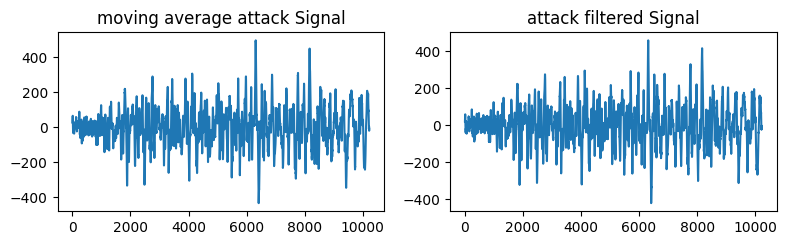

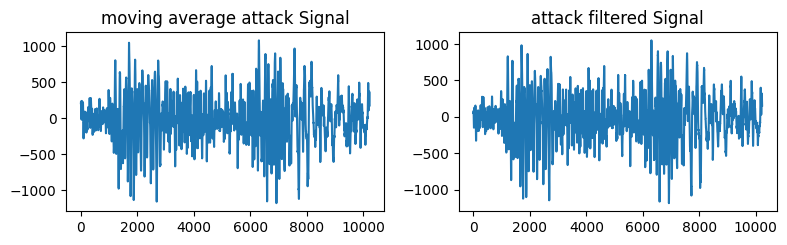

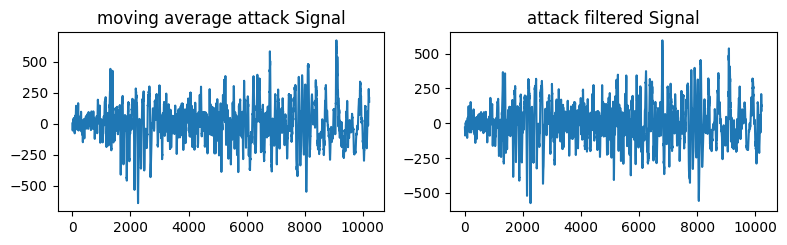

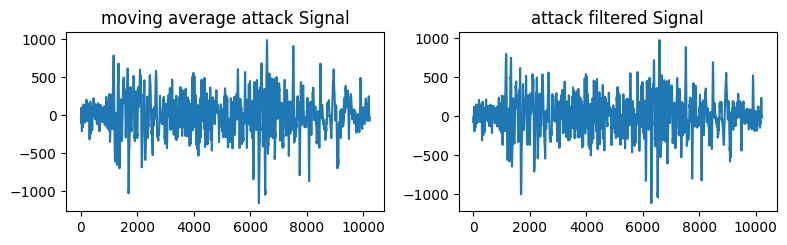

In [13]:
attack_filtered = []
for i in range (23):
    attack_filtered.append(signal.filtfilt(b,a,moving_attack[i]))
    plt.figure(figsize=(8,50))
    plt.subplot(23,2,2*i+1)
    plt.plot(moving_attack[i])
    plt.title('moving average attack Signal')

    plt.subplot(23,2,2*i+2)
    plt.plot(attack_filtered[i])
    plt.title('attack filtered Signal')
    plt.tight_layout()
    plt.show()

# Q6

In [156]:
b1, a1 = signal.butter(3,[0.5,3], btype='bandpass',fs=256)
b2, a2 = signal.butter(3,[4,7], btype='bandpass',fs=256)
b3, a3 = signal.butter(3,[8,13], btype='bandpass',fs=256)
b4, a4 = signal.butter(3,[13,30], btype='bandpass',fs=256)

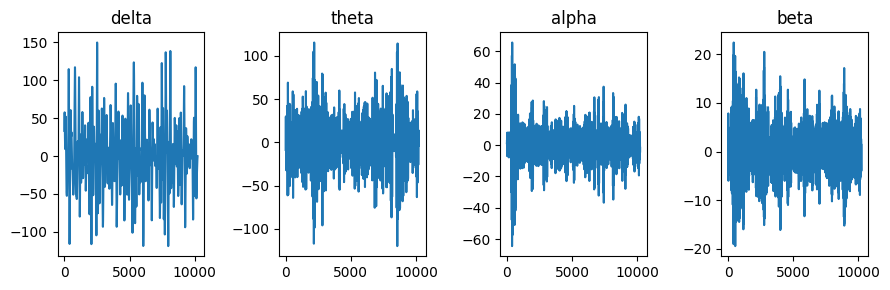

In [157]:
normal_filtered1 = (signal.filtfilt(b1,a1,normal_filtered[5]))
normal_filtered2 = (signal.filtfilt(b2,a2,normal_filtered[5]))
normal_filtered3 = (signal.filtfilt(b3,a3,normal_filtered[5]))
normal_filtered4 = (signal.filtfilt(b4,a4,normal_filtered[5]))

plt.figure(figsize=(9,3))
plt.subplot(1,4,1)
plt.plot(normal_filtered1)
plt.title('delta')

plt.subplot(1,4,2)
plt.plot(normal_filtered2)
plt.title('theta')

plt.subplot(1,4,3)
plt.plot(normal_filtered3)
plt.title('alpha')

plt.subplot(1,4,4)
plt.plot(normal_filtered4)
plt.title('beta')

plt.tight_layout()
plt.show()

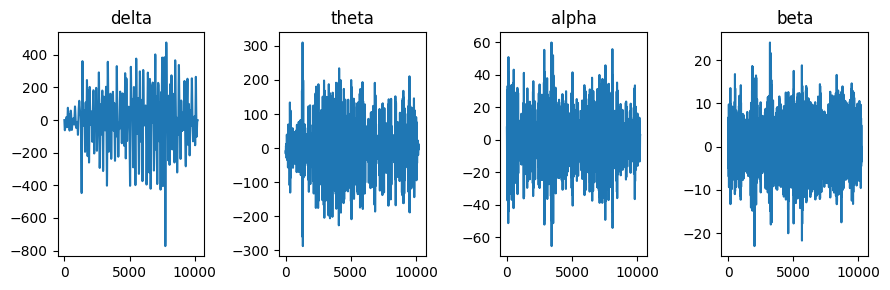

In [158]:
attack_filtered1 = (signal.filtfilt(b1,a1,attack_filtered[5]))
attack_filtered2 = (signal.filtfilt(b2,a2,attack_filtered[5]))
attack_filtered3 = (signal.filtfilt(b3,a3,attack_filtered[5]))
attack_filtered4 = (signal.filtfilt(b4,a4,attack_filtered[5]))

plt.figure(figsize=(9,3))
plt.subplot(1,4,1)
plt.plot(attack_filtered1)
plt.title('delta')

plt.subplot(1,4,2)
plt.plot(attack_filtered2)
plt.title('theta')

plt.subplot(1,4,3)
plt.plot(attack_filtered3)
plt.title('alpha')

plt.subplot(1,4,4)
plt.plot(attack_filtered4)
plt.title('beta')

plt.tight_layout()
plt.show()

# Q7

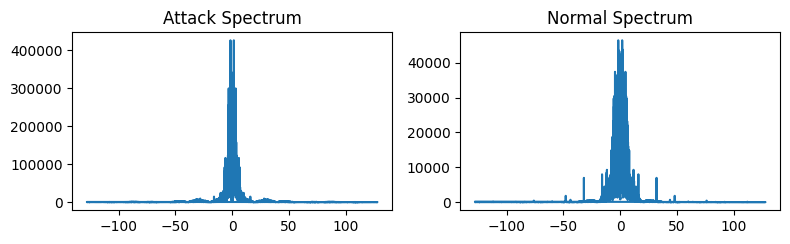

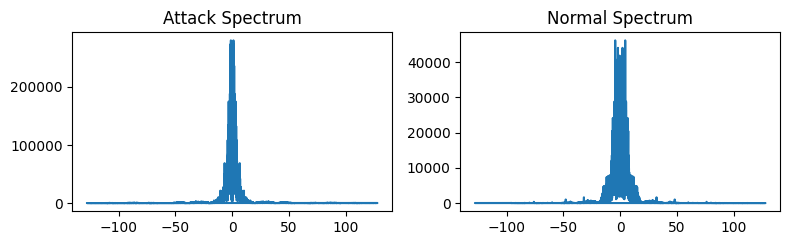

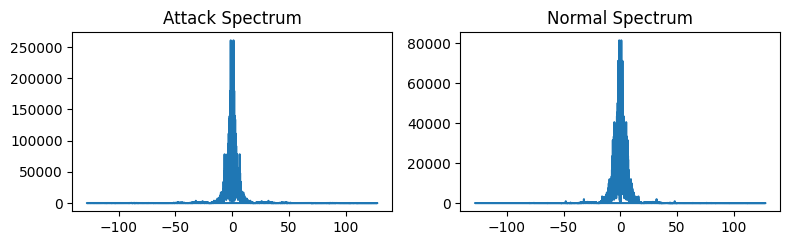

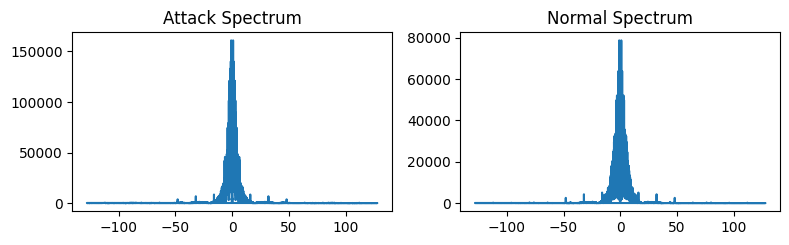

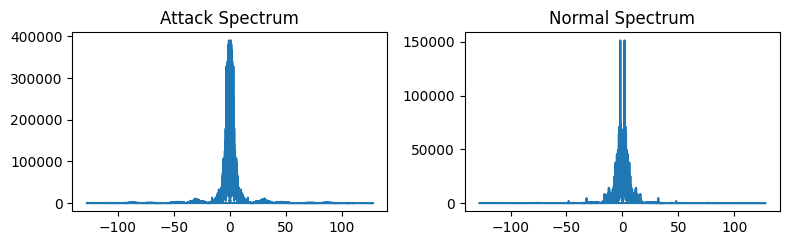

...

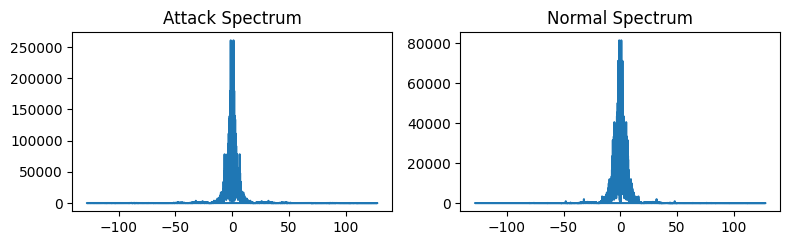

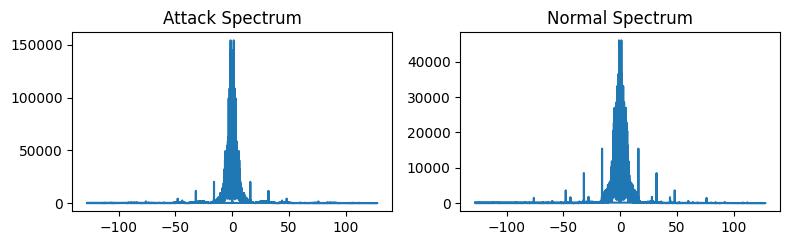

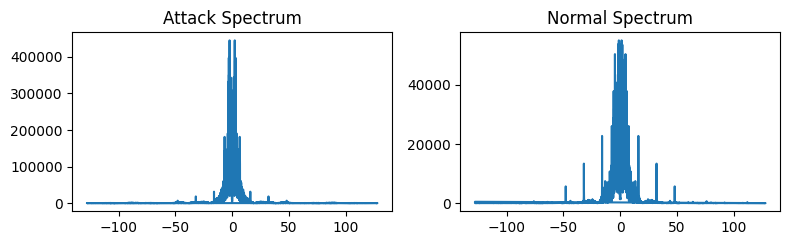

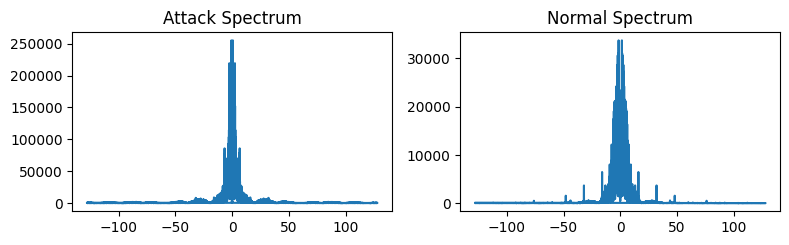

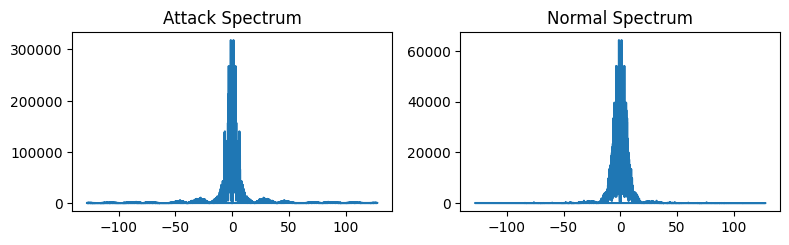

In [14]:
for i in range (23):
    yf = fft(attack_filtered[i])
    x = fftfreq(len(attack_filtered[i]),1/256)
    plt.figure(figsize=(8,50))
    plt.subplot(23,2,2*i+1)
    plt.plot(x , np.abs(yf))
    plt.title('Attack Spectrum')

    yf = fft(normal_filtered[i])
    x = fftfreq(len(normal_filtered[i]),1/256)
    plt.subplot(23,2,2*i+2)
    plt.plot(x , np.abs(yf))
    plt.title('Normal Spectrum')
    plt.tight_layout()
    plt.show()